In [1]:
%load_ext autoreload
%autoreload 2 

In [15]:
import matplotlib.pyplot as plt
import mrcfile, torch, copick

import numpy as np
import utils

from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from tqdm.notebook import tqdm

# use bfloat16 for the entire notebook.
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

if torch.cuda.get_device_properties(0).major >= 8:
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [3]:
copick_config = (
    "/hpc/projects/group.czii/krios1.processing/copick/24jul29c/run001/vatpase_config.json"
)
name = "lysosome"

# Open Copick Project and Query All Available Runs
root = copick.from_file(copick_config)
run_ids = [run.name for run in root.runs]

In [4]:
runs_with_lysosomes = []
coords_per_run = []
for run in root.runs:
    coords = utils.get_coordinates(run)
    if coords is None or not utils.check_tomogram(run):
        continue
    runs_with_lysosomes.append(run)
    coords_per_run.append(coords)


Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_11_2_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_12_3_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_12_4_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_12_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_3_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_4_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_5_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_6_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_14_2_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_14_Vol
Getti

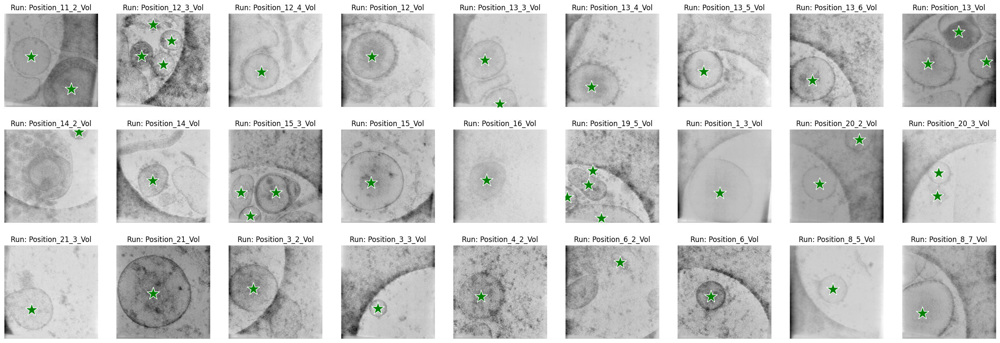

In [5]:
fig, axs = plt.subplots(3, 9, figsize=[30, 10])
axs = axs.flatten()
projections_all = []
for _i, run in enumerate(runs_with_lysosomes):
    coords = coords_per_run[_i]
    tomogram = utils.get_tomogram(run)
    projection = utils.project_tomogram(tomogram)
    projections_all.append(projection)
    axs[_i].imshow(projection, cmap="gray")
    axs[_i].scatter(coords[:, 2], coords[:, 1], marker="*", c="g", edgecolor="white", s=500)
    axs[_i].set_title(f"Run: {run.name}")
    axs[_i].axis("off")


In [6]:
sam2_checkpoint = "../../segment-anything-2/checkpoints/sam2_hiera_small.pt"
model_cfg = "sam2_hiera_s.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, post_process=True)

mask_generator = SAM2AutomaticMaskGenerator(
    model=sam2,
    points_per_side=32,
    points_per_batch=64,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.9,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,
    use_m2m=True,
)

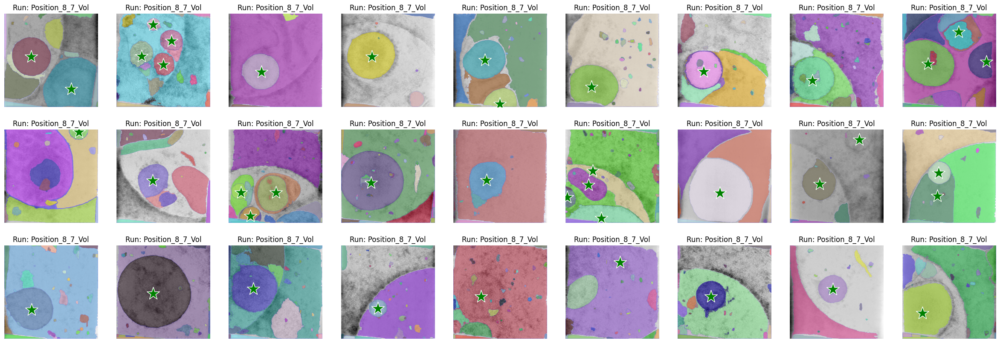

In [7]:
fig, axs = plt.subplots(3, 9, figsize=[30, 10])
axs = axs.flatten()

for _i, projection in enumerate(projections_all):
    coords = coords_per_run[_i]

    img_to_segment = utils.prepare_img_for_mask_generation(projection)
    masks = mask_generator.generate(img_to_segment)

    axs[_i].imshow(projection, cmap="gray")
    axs[_i].scatter(coords[:, 2], coords[:, 1], marker="*", c="g", edgecolor="white", s=500)

    utils.show_anns(axs[_i], masks)

    axs[_i].set_title(f"Run: {run.name}")
    axs[_i].axis("off")


In [10]:
projections_per_coord = []
for _i, run in enumerate(runs_with_lysosomes):
    coords = coords_per_run[_i]
    tomogram = utils.get_tomogram(run)
    for coord in coords:
        projection = utils.project_tomogram(tomogram, int(coord[0]) - 30, 60)
        projections_per_coord.append((projection, coord, run))


Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_11_2_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_12_3_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_12_4_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_12_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_3_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_4_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_5_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_6_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_13_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_14_2_Vol
Getting denoised Tomogram with 10 A voxel size for the associated runID: Position_14_Vol
Getti

In [11]:
len(projections_per_coord)

41

0it [00:00, ?it/s]

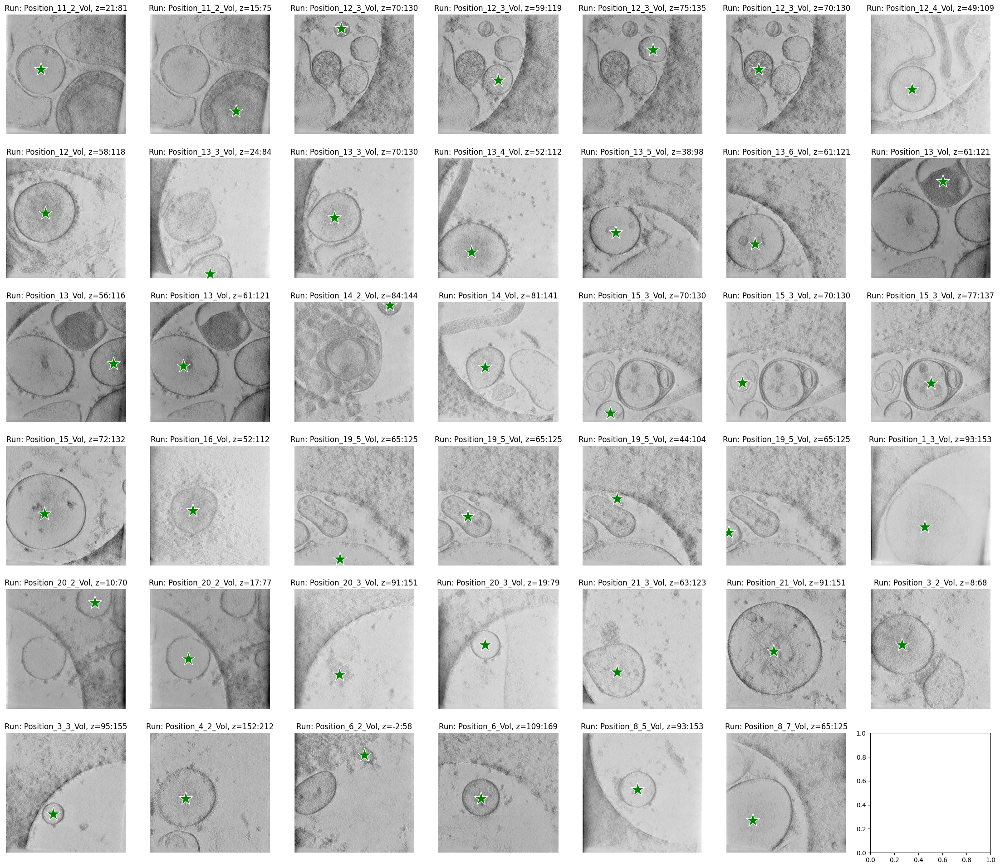

In [17]:
fig, axs = plt.subplots(6, 7, figsize=[28, 24])
axs = axs.flatten()
projections_all = []
for _i, (projection, coord, run) in tqdm(enumerate(projections_per_coord)):
    # img_to_segment = utils.prepare_img_for_mask_generation(projection)
    # masks = mask_generator.generate(img_to_segment)

    axs[_i].imshow(projection, cmap="gray")

    # utils.show_anns(axs[_i], masks)

    axs[_i].scatter(coord[2], coord[1], marker="*", c="g", edgecolor="white", s=500)
    z1 = int(coord[0]) - 30
    z2 = int(coord[0]) + 30
    axs[_i].set_title(f"Run: {run.name}, z={z1}:{z2}")
    axs[_i].axis("off")


0it [00:00, ?it/s]

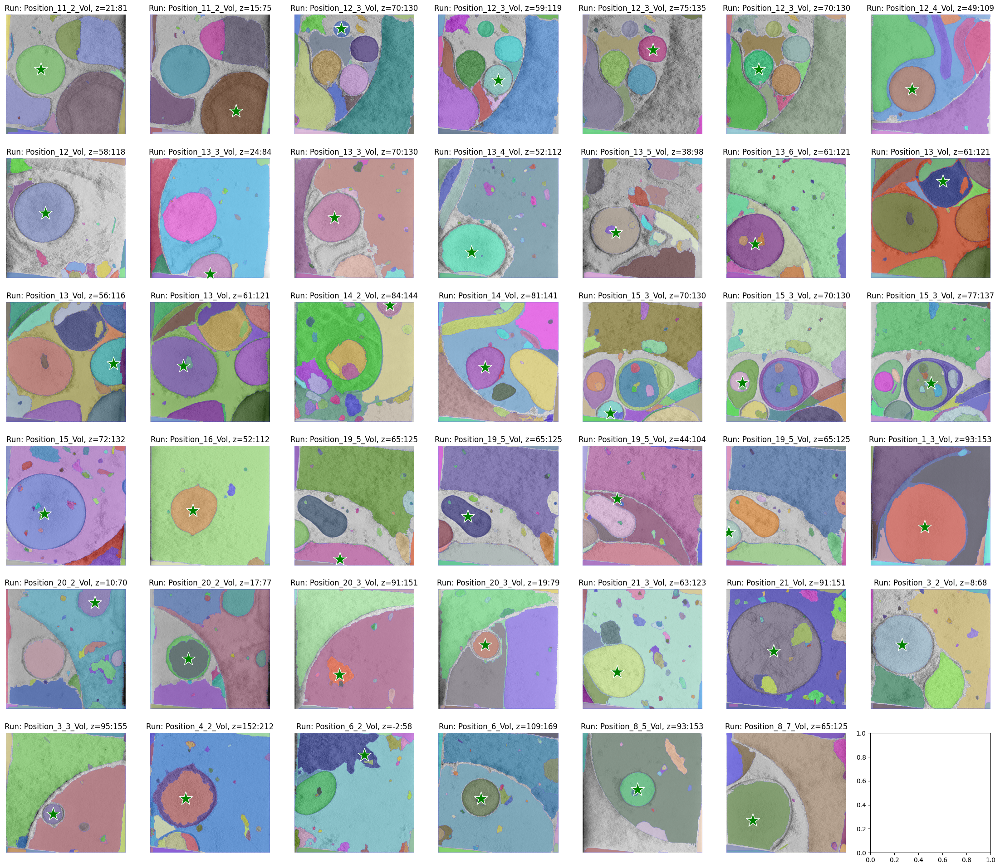

In [16]:
fig, axs = plt.subplots(6, 7, figsize=[28, 24])
axs = axs.flatten()
projections_all = []
for _i, (projection, coord, run) in tqdm(enumerate(projections_per_coord)):
    img_to_segment = utils.prepare_img_for_mask_generation(projection)
    masks = mask_generator.generate(img_to_segment)

    axs[_i].imshow(projection, cmap="gray")

    utils.show_anns(axs[_i], masks)

    axs[_i].scatter(coord[2], coord[1], marker="*", c="g", edgecolor="white", s=500)
    z1 = int(coord[0]) - 30
    z2 = int(coord[0]) + 30
    axs[_i].set_title(f"Run: {run.name}, z={z1}:{z2}")
    axs[_i].axis("off")


In [18]:
mask_generator2 = SAM2AutomaticMaskGenerator(
    model=sam2,
    points_per_side=32,
    points_per_batch=64,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.9,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,
    use_m2m=True,
)

0it [00:00, ?it/s]

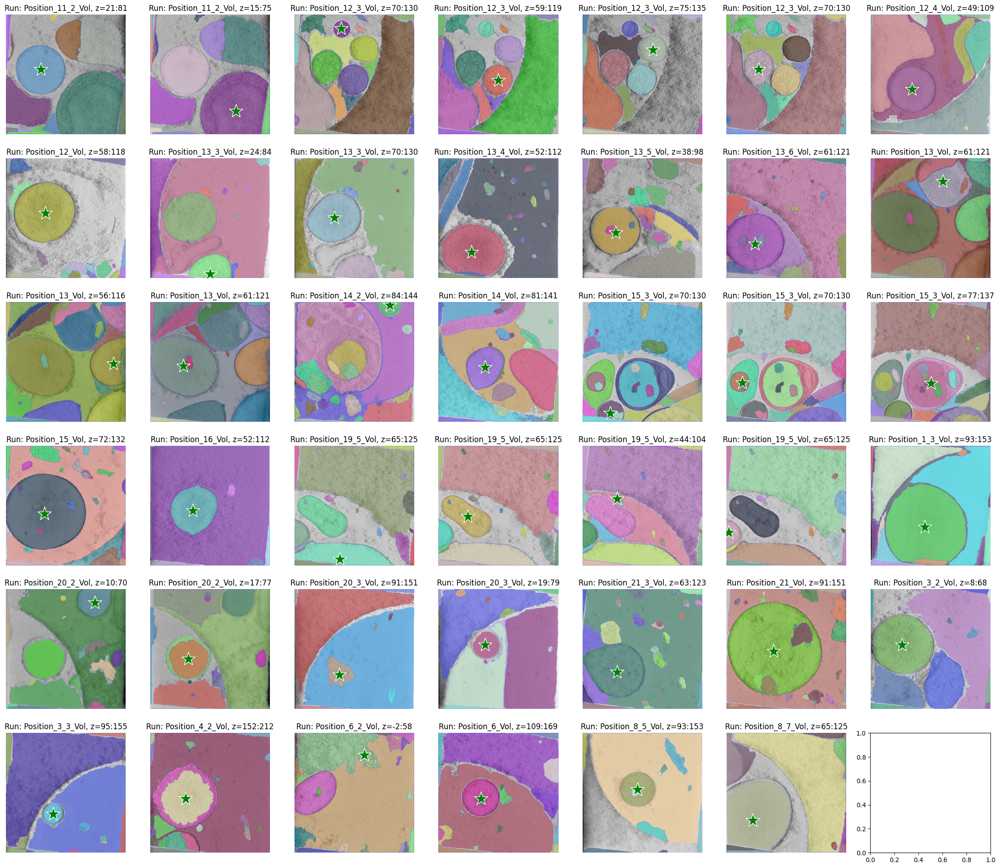

In [19]:
fig, axs = plt.subplots(6, 7, figsize=[28, 24])
axs = axs.flatten()
projections_all = []
for _i, (projection, coord, run) in tqdm(enumerate(projections_per_coord)):
    img_to_segment = utils.prepare_img_for_mask_generation(projection)
    masks = mask_generator2.generate(img_to_segment)

    axs[_i].imshow(projection, cmap="gray")

    utils.show_anns(axs[_i], masks)

    axs[_i].scatter(coord[2], coord[1], marker="*", c="g", edgecolor="white", s=500)
    z1 = int(coord[0]) - 30
    z2 = int(coord[0]) + 30
    axs[_i].set_title(f"Run: {run.name}, z={z1}:{z2}")
    axs[_i].axis("off")
